<a href="https://colab.research.google.com/github/Gedeon-m-gedus/Image_Processing/blob/master/CV_09_Detection_and_segmentation.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Part A: Installation of Detectron2

- First I need to be sure that my computer OS is either Linux or Mac os and I have installed Python with atleas version 3.6, and  my Pytoch version is atleast 1.4.
- I should install torchvision that matches the PyTorch installation.
- For demo and visualization I might need OpenCV. 
- pycocotools: pip install cython; pip install -U 'git+https://github.com/cocodataset/cocoapi.git#subdirectory=PythonAPI'.
- gcc & g++ ≥ 5 are required. For the sake of speed I should use **ninja**



#### Installing and making sure that all requirements are satisfied

In [0]:
# opencv is pre-installed on colab
# install dependencies: (use cu101 because colab has CUDA 10.1)
!pip install -U torch==1.4 torchvision==0.5 -f https://download.pytorch.org/whl/cu101/torch_stable.html 
!pip install cython pyyaml==5.1
!pip install -U 'git+https://github.com/cocodataset/cocoapi.git#subdirectory=PythonAPI'
import torch, torchvision
print(torch.__version__, torch.cuda.is_available())
!gcc --version

Looking in links: https://download.pytorch.org/whl/cu101/torch_stable.html
     |████████████████████████████████| 753.4MB 21kB/s 
     |████████████████████████████████| 4.0MB 38.3MB/s 
  Found existing installation: torch 1.5.0+cu101
    Uninstalling torch-1.5.0+cu101:
      Successfully uninstalled torch-1.5.0+cu101
  Found existing installation: torchvision 0.6.0+cu101
    Uninstalling torchvision-0.6.0+cu101:
      Successfully uninstalled torchvision-0.6.0+cu101
     |████████████████████████████████| 276kB 4.6MB/s 
  Created wheel for pyyaml: filename=PyYAML-5.1-cp36-cp36m-linux_x86_64.whl size=44074 sha256=eadf18c49aa286280a9bf35a95cf3c8fc12b9e52305f7ff9f881081855e1be5a
  Stored in directory: /root/.cache/pip/wheels/ad/56/bc/1522f864feb2a358ea6f1a92b4798d69ac783a28e80567a18b
Successfully built pyyaml
  Found existing installation: PyYAML 3.13
    Uninstalling PyYAML-3.13:
      Successfully uninstalled PyYAML-3.13
  Cloning https://github.com/cocodataset/cocoapi.git to /tmp/pip

#### Installing Detectron2

In [0]:
# install detectron2:
!pip install detectron2 -f https://dl.fbaipublicfiles.com/detectron2/wheels/cu101/index.html

Looking in links: https://dl.fbaipublicfiles.com/detectron2/wheels/cu101/index.html
     |████████████████████████████████| 6.2MB 1.9MB/s 
  Created wheel for fvcore: filename=fvcore-0.1.dev200502-cp36-none-any.whl size=40567 sha256=128ce1f11c6ba9a411eb9551d9a752cb9cd9e1aae34bbaca57059c6e51eeeee9
  Stored in directory: /root/.cache/pip/wheels/6c/e2/78/df116f1145ba7dd76f3103f13effc7dca51923bf618d0b53c7
Successfully built fvcore


#### Setup detectron2 logger

In [0]:
# Setup detectron2 logger
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

<Logger detectron2 (DEBUG)>

#### Common Imports

In [0]:
# import some common libraries
import numpy as np
import cv2
import random
from google.colab.patches import cv2_imshow

#### importing some common detectron2 utilities

In [0]:
# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog

## Part B: Run a pre-trained model for instance segmentation

#### Let's mount my Google drive and get an image

In [0]:
from google.colab import drive 
drive.mount('/content/gdrive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/gdrive


In [0]:
path1 = "/content/gdrive/My Drive/personal_files/pictures/ged_nah.jpg"
path2 = "/content/gdrive/My Drive/personal_files/pictures/gedeonmp.jpeg"
path3 = "/content/gdrive/My Drive/personal_files/pictures/deg_dev.jpg"
path4 = "/content/gdrive/My Drive/personal_files/pictures/bbbb.jpg"
!wget https://www.worldatlas.com/r/w1200-h701-c1200x701/upload/fa/99/3d/shutterstock-1047598105.jpg -O lion.jpg
!wget https://i.ytimg.com/vi/D__C0nCLln8/maxresdefault.jpg -O car_lion.jpg
!wget https://www.w3schools.com/howto/img_snow.jpg -O mount.jpg
!wget https://sc01.alicdn.com/kf/U548f89eb5ddb4187aede588370de7ffbg.jpg -O dinning.jpg
!wget https://nodeassets.nbcnews.com/cdnassets/projects/2017/08/airplane-mode/planes-brands-02.jpg -O airplane.jpg
!wget https://flugblogg.is/wp-content/uploads/2018/12/113.jpg -O man_plane.jpg
!wget https://pbs.twimg.com/media/EEKpH_dX4AArRBe.jpg -O ugh.jpg
!wget https://inservice.ascd.org/wp-content/uploads/2014/07/class-scaled.jpg -O std.jpg
!wget https://www.pearsoned.com/wp-content/uploads/Multi-racial-group-of-high-school-students-sitting-in-a-circle-talking-and-holding-laptops-and-tablets-770x370.jpg -O ss.jpg
!wget https://lifeisanepisode.com/wp-content/uploads/dancing-couple.jpg -O dance.jpg
!wget https://media.nu.nl/m/tk9xvmda7ax8_wd1280.jpg/winnaar-finale-dancing-on-ice-bekend.jpg -O dd.jpg
!wget https://static01.nyt.com/images/2020/01/28/well/physed-babies/physed-babies-superJumbo.jpg -O babies.jpg
!wget https://nnimgt-a.akamaihd.net/transform/v1/crop/frm/gfyFBZ2A3aREPWrpf4KzA3/58d893ee-77d2-4605-9247-b5b83b5dcea0.png/r0_0_4176_2357_w1200_h678_fmax.jpg -O kid.jpg



image1 = cv2.imread(path1)
image2 = cv2.imread(path2)
image3 = cv2.imread(path3)
image4 = cv2.imread('./car_lion.jpg')
image5 = cv2.imread('./mount.jpg')
image6 = cv2.imread('./lion.jpg')
image7 = cv2.imread('./dinning.jpg')
image8 = cv2.imread('./airplane.jpg')
image9 = cv2.imread('./man_plane.jpg')
image10 = cv2.imread('./ugh.jpg')
im = cv2.imread(path4)
image11 = cv2.imread('./std.jpg')
image12 = cv2.imread('./ss.jpg')
image13 = cv2.imread('./dance.jpg')
image14 = cv2.imread('./babies.jpg')
image15 = cv2.imread('./kid.jpg')
#image14 = cv2.imread('./dd.jpg')
# cv2_imshow(image1)
# cv2_imshow(image2)
# cv2_imshow(image3)
# cv2_imshow(im)
# cv2_imshow(image4)
# cv2_imshow(image5)
# cv2_imshow(image6)
# cv2_imshow(image7)
#cv2_imshow(image10)

--2020-05-02 15:11:07--  https://www.worldatlas.com/r/w1200-h701-c1200x701/upload/fa/99/3d/shutterstock-1047598105.jpg
Resolving www.worldatlas.com (www.worldatlas.com)... 146.20.176.192
Connecting to www.worldatlas.com (www.worldatlas.com)|146.20.176.192|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 104441 (102K) [image/jpeg]
Saving to: ‘lion.jpg’

lion.jpg            100%[===================>] 101.99K  --.-KB/s    in 0.1s    

2020-05-02 15:11:08 (852 KB/s) - ‘lion.jpg’ saved [104441/104441]

--2020-05-02 15:11:09--  https://i.ytimg.com/vi/D__C0nCLln8/maxresdefault.jpg
Resolving i.ytimg.com (i.ytimg.com)... 74.125.197.119, 2607:f8b0:400e:c07::77
Connecting to i.ytimg.com (i.ytimg.com)|74.125.197.119|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 75162 (73K) [image/jpeg]
Saving to: ‘car_lion.jpg’

car_lion.jpg        100%[===================>]  73.40K  --.-KB/s    in 0.001s  

2020-05-02 15:11:09 (120 MB/s) - ‘car_lion.jpg’ saved 

In [0]:
#images = [image1,image2,image3,image4,image5,image6,image7,image8,image9,image10,im]
#images = [image1,image2,image3,image4,image5,image6,image7,image8,image9,image10,im]

images = [image10,image12,image11,image13,image14,image15]

#### Get pretrained model

In [0]:
cfg = get_cfg()
# add project-specific config (e.g., TensorMask) here if you're not running a model in detectron2's core library
cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"))
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5  # set threshold for this model
# Find a model from detectron2's model zoo. You can use the https://dl.fbaipublicfiles... url as well
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml")
predictor = DefaultPredictor(cfg)


model_final_f10217.pkl: 178MB [00:02, 67.3MB/s]                           


#### Let's predict and have a look at the predictions

In [0]:
outputs = []
for im in images:
  outputs.append(predictor(im))
for i in range(len(images)):
  print('\n Predictions for Image',i+1,'\n')
  print(outputs[i]["instances"].pred_classes)
  print(outputs[i]["instances"].pred_boxes,'\n')


 Predictions for Image 1 

tensor([ 0,  0,  0,  0,  0,  0,  0,  0, 13, 13], device='cuda:0')
Boxes(tensor([[6.4535e+01, 1.9167e+02, 3.6121e+02, 8.9313e+02],
        [4.7239e+02, 6.9964e+01, 6.6583e+02, 8.4805e+02],
        [9.2198e+02, 1.8983e+02, 1.1981e+03, 8.8895e+02],
        [9.1872e+02, 1.7491e+02, 1.0862e+03, 7.5963e+02],
        [5.5183e-01, 5.4836e+01, 1.0392e+02, 5.9102e+02],
        [6.2887e+02, 1.4001e+02, 8.8721e+02, 7.7700e+02],
        [1.2356e+02, 1.5368e+02, 3.9203e+02, 4.0984e+02],
        [6.0833e+02, 1.5195e+02, 6.9088e+02, 4.4959e+02],
        [2.9689e+02, 3.4981e+02, 5.1113e+02, 5.3890e+02],
        [2.9994e+02, 3.5172e+02, 8.6953e+02, 5.1899e+02]], device='cuda:0')) 


 Predictions for Image 2 

tensor([ 0,  0,  0,  0,  0,  0, 63,  0, 67, 63, 67,  0,  0,  0,  0,  0,  0],
       device='cuda:0')
Boxes(tensor([[3.5928e+02, 8.3664e+01, 5.9267e+02, 3.6653e+02],
        [2.0652e+02, 4.5006e+00, 3.8709e+02, 3.4391e+02],
        [5.1439e+02, 5.8985e+01, 6.8534e+02, 3.1

#### Let's have a look at the prediction

#### Visualizing the output

In [0]:
# We can use `Visualizer` to draw the predictions on the image.
for i,image in enumerate(images):
  v = Visualizer(image[:, :, ::-1], MetadataCatalog.get(cfg.DATASETS.TRAIN[0]), scale=1.2)
  v = v.draw_instance_predictions(outputs[i]["instances"].to("cpu"))
  segmented_image = v.get_image()[:, :, ::-1]
  cv2_imshow(segmented_image)
## for the secon image


In [0]:
#cv2.imwrite("/content/gdrive/My Drive/personal_files/pictures/ged_dev_segmet.jpg",segmented_image3)

## Part C: Run a pre-trained model for pose estimation

#### Getting pretrained model for pose estimation

In [0]:
# Inference with a keypoint detection model
cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-Keypoints/keypoint_rcnn_R_50_FPN_3x.yaml"))
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.7  # set threshold for this model
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Keypoints/keypoint_rcnn_R_50_FPN_3x.yaml")
pose_predictor = DefaultPredictor(cfg)


model_final_a6e10b.pkl: 237MB [00:03, 65.4MB/s]                           


#### Predicting human pose

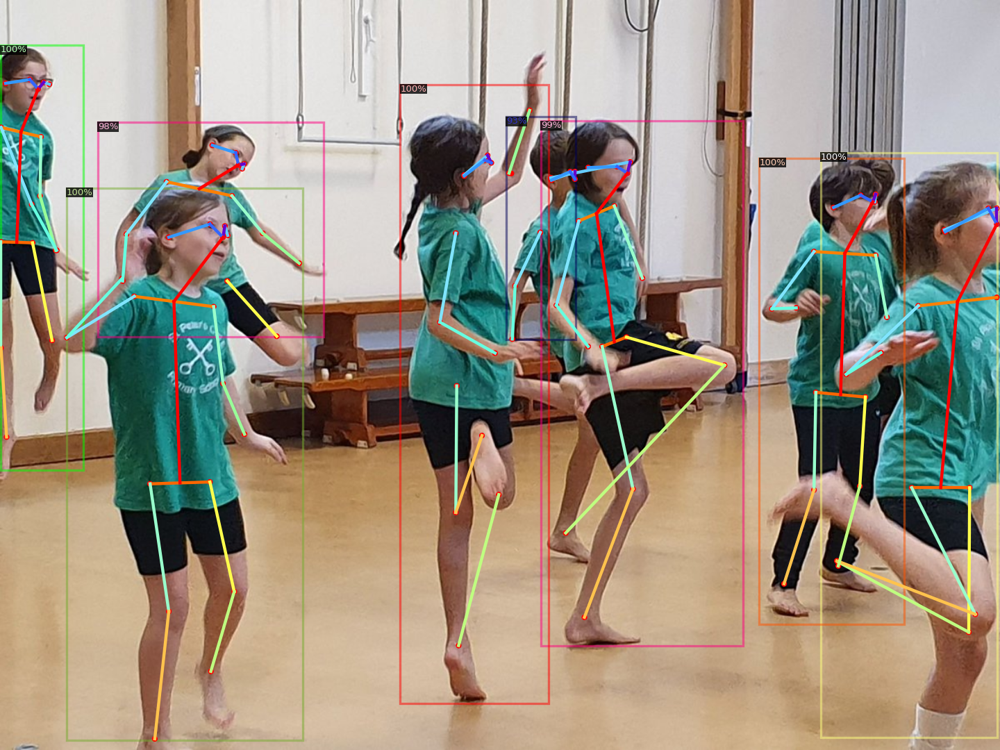

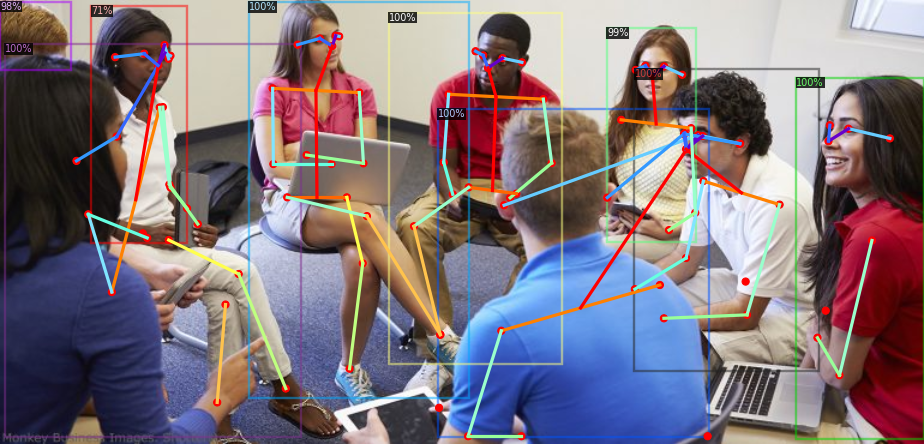

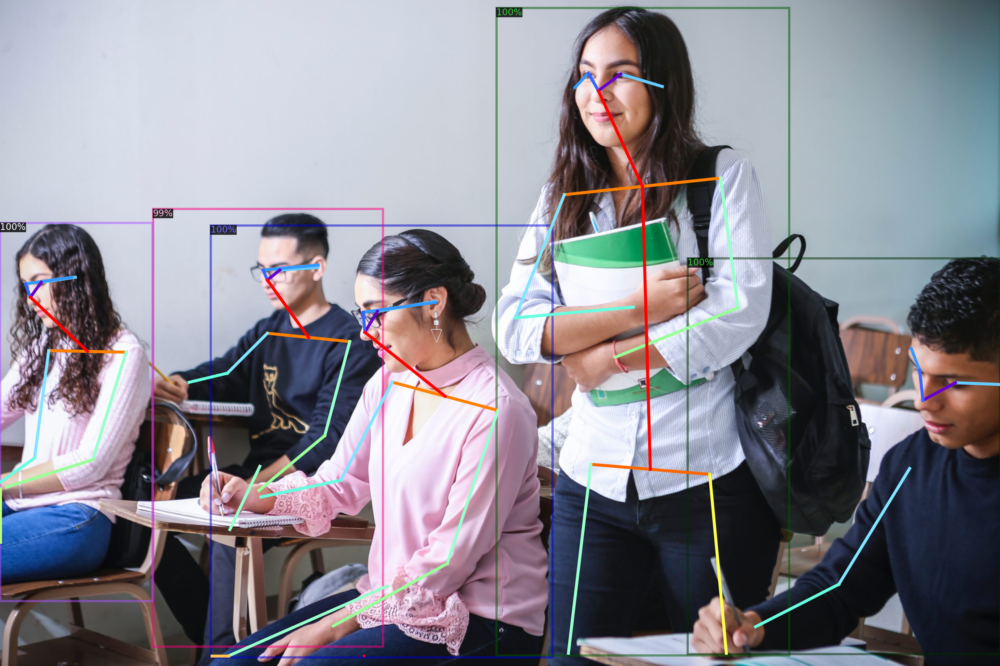

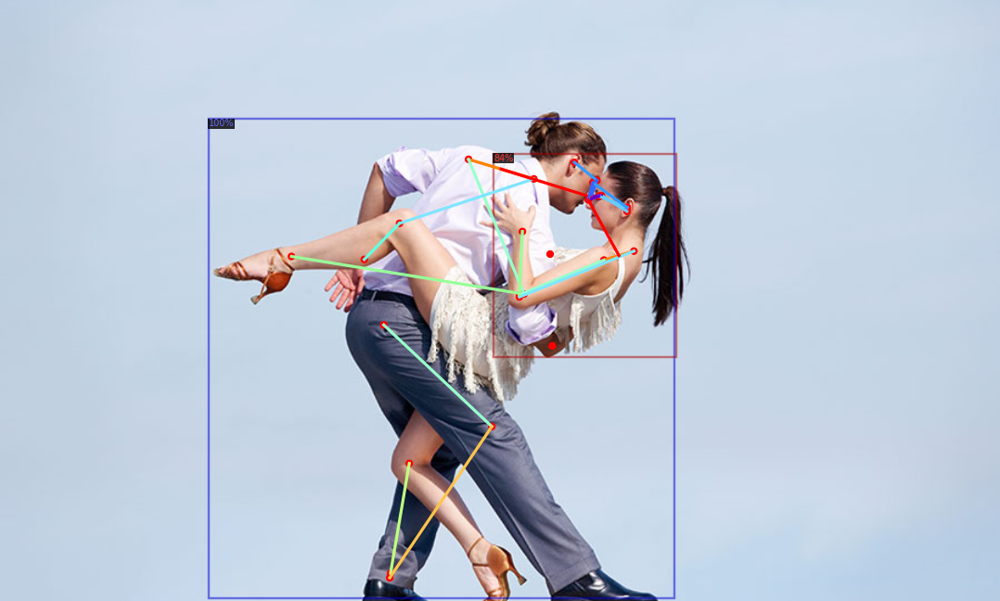

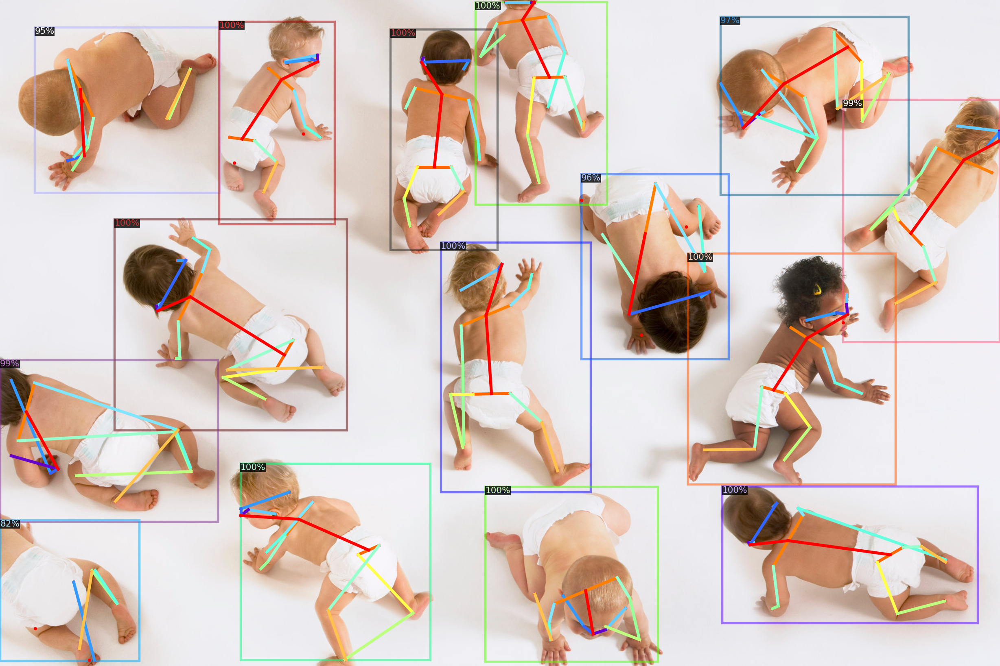

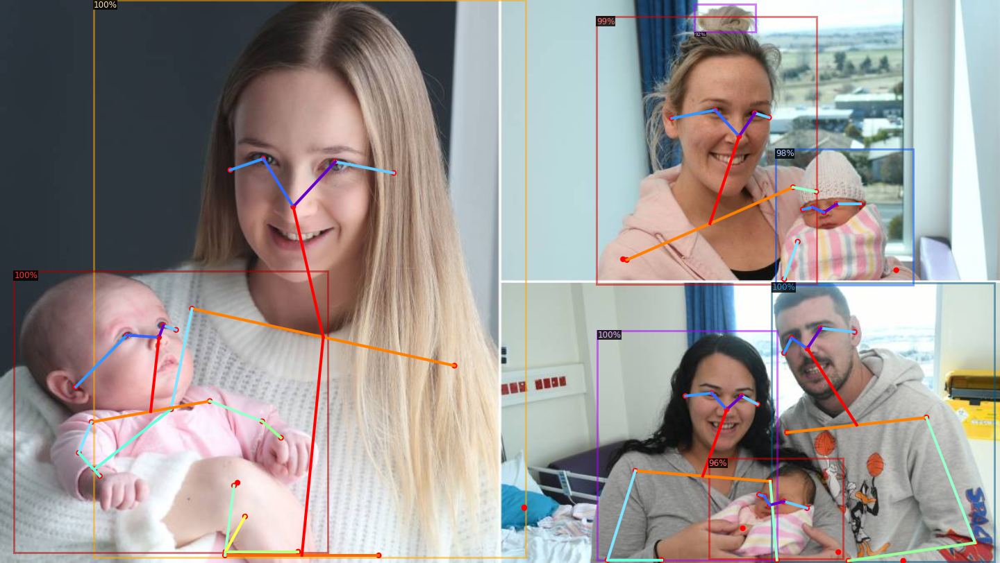

In [0]:
for i,im in enumerate(images):
  pose_outputs = pose_predictor(im)
  v = Visualizer(im[:,:,::-1], MetadataCatalog.get(cfg.DATASETS.TRAIN[0]), scale=1.2)
  v = v.draw_instance_predictions(pose_outputs["instances"].to("cpu"))
  cv2_imshow(v.get_image()[:, :, ::-1])